In [1]:
import matplotlib.pyplot as plt
import os
import math
import numpy as np
import pandas as pd
import re

import time
import torch
import torch.nn

import random
import pickle

# import self-defined module
from utils_eval import AverageMeter

In [2]:
if torch.cuda.is_available():
    print(torch.cuda.current_device())
    print(torch.cuda.device(0))
    print(torch.cuda.device_count())
    print(torch.cuda.get_device_name(0))
else:
    print('CUDA is not available.')

0
1
NVIDIA A100-PCIE-40GB


In [3]:
import torch.backends.cudnn as cudnn
if torch.cuda.is_available():
    device = torch.device("cuda:0")
    # work on a single GPU or CPU
    cudnn.benchmark=True
else:
    device = torch.device("cpu")
    cudnn.benchmark=False

print(device)
print(torch.cuda.get_device_name(0))

cuda:0
NVIDIA A100-PCIE-40GB


In [4]:
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

# 1. Load data

### a. Microbiome

In [5]:
microbiome_df = pd.read_csv('../data/combined.genus_abundance.with_archaea_bacteria_only.clr.transformed.csv', index_col=0)
microbiome_df.shape

(1933, 1778)

In [6]:
GENERATE_METADATA = False

In [7]:
if GENERATE_METADATA:
    import requests
    import pandas as pd

    # List of file UUIDs
    file_uuids = microbiome_df.index

    # Initialize an empty list to store data
    metadata_list = []

    # Base URL for the GDC API
    base_url = "https://api.gdc.cancer.gov/files/"
    params = {
        "expand": "cases.samples,annotations",
    }

    # Loop through each file UUID
    for i, file_uuid in enumerate(file_uuids[414:]):
        print(i, file_uuid)
        # Fetch metadata for the file
        url = f"{base_url}{file_uuid}"
        response = requests.get(url, params=params)
        metadata = response.json()
        
        # Extract the required information
        experimental_strategy = metadata['data']['experimental_strategy']
        
        # Iterate over the samples associated with the file
        for case in metadata['data'].get('cases', []):
            for sample in case.get('samples', []):
                submitter_id = sample['submitter_id']
                sample_id = sample['sample_id']
                sample_type = sample['sample_type']
                
                # Append a row to the data list
                metadata_list.append({
                    "file_uuid": file_uuid,
                    "submitter_id": submitter_id,
                    "sample_id": sample_id,
                    "sample_type": sample_type,
                    "experimental_strategy": experimental_strategy
                })

    # Create a pandas DataFrame
    metadata_df = pd.DataFrame(metadata_list)
    metadata_df.to_csv('../data/metadata_df.csv', index=False)
else:
    metadata_df = pd.read_csv('../data/metadata_df.csv')


In [8]:
microbiome_metadata_df = pd.merge(left=microbiome_df, right=metadata_df, how='left', left_index=True, right_on='file_uuid')

# only keep the first row for each TCGA barcode
microbiome_metadata_df['barcode_base'] = microbiome_metadata_df['submitter_id'].str[:-1]
microbiome_metadata_df = microbiome_metadata_df.sort_values('submitter_id', ascending=True).drop_duplicates(subset='barcode_base', keep='first')
microbiome_metadata_df = microbiome_metadata_df.drop(columns=['submitter_id'])

### b. Clinical variables

In [9]:
### Read clinical varaible data
clinical_immune_variables_df = pd.read_excel('../data/Master Table-Alteration in CNV, Mut, Pathway .xlsx', sheet_name='Clinical variables', 
                                             header=0, index_col=1, 
                                             na_values=['[Not Applicable]', '#N/A', '[Not Available]',
                                                        '[Discrepancy]', '[Not Evaluated]', '[Unknown]'])

# Remove duplicate columns
import re
for c in clinical_immune_variables_df.columns:
    if re.search('.*[.]\d', c): # Matches any string that contains at least one digit (\d) preceded by a literal period (.)
        clinical_immune_variables_df = clinical_immune_variables_df.drop(columns = [c])
clinical_immune_variables_df = clinical_immune_variables_df.drop(columns = ['OS Time', 'OS.time (months)', 'OS', 
                                                                            'PFI Time', 'DSS.time (days)'])

# Pick out immune variables
imune_check_df = pd.read_csv('../data/immune_check_df.csv', header=0, index_col=0)
clinical_variables_names = imune_check_df['features'].loc[imune_check_df['immune feature (1/0)'] != 1].values
clinical_variables_df = clinical_immune_variables_df.loc[:, clinical_variables_names]

# 2. Process and merge data

In [10]:
def remove_missing_rows(dataset, microbiome_column_index):
    start_idx = microbiome_column_index[0]
    end_idx = microbiome_column_index[1]
    
    na_idx = np.where(pd.isna(dataset.iloc[:,start_idx:end_idx]).sum(axis=1)==(end_idx-start_idx))[0]
    dataset_nona = dataset.drop(dataset.index[na_idx], axis=0)
    return dataset_nona

In [11]:
def subsetting(dataset, columns, remain_value_list):
    for column, remain_value in zip(columns, remain_value_list):
        idx_remain = np.isin(dataset.loc[:, column], remain_value)
        dataset = dataset.loc[idx_remain, :]
    return dataset

In [12]:
def remove_missing_rows(dataset, microbiome_column_index):
    start_idx = microbiome_column_index[0]
    end_idx = microbiome_column_index[1]
    
    na_idx = np.where(pd.isna(dataset.iloc[:,start_idx:end_idx]).sum(axis=1)==(end_idx-start_idx))[0]
    dataset_nona = dataset.drop(dataset.index[na_idx], axis=0)
    return dataset_nona

In [13]:
def merge_clinical_microbiome(disease, clinical_variables_df, microbiome_metadata_df, 
                              subsetting_columns=['sample_type', 'experimental_strategy'], 
                              remain_value_list=[['Primary Tumor'], ['RNA-Seq']]):
    
    
    ### Read clinical data
    clinical_variables_df_disease = clinical_variables_df.loc[clinical_variables_df['DISEASE'] == disease,:]
    import re
    na_col_idx = np.where([re.search('Unnamed.*', clinical_variables_df_disease.columns[i]) 
                            for i in range(clinical_variables_df_disease.shape[1])])
    rm_col_name = ['type','order in TCGA clinical data table', 'patientBarcode', 'bcr_patient_barcode',
                    'barcode', 'TCGA Participant Barcode', 'TCGA Study']
    clinical_variables_df_disease = clinical_variables_df_disease.\
            drop(columns=list(clinical_variables_df_disease.columns[na_col_idx]) + rm_col_name)

    print('========================================================================')
    print(disease.upper())
    print('< Clinical Variables >')
    print('Total sample #:', clinical_variables_df_disease.shape[0])
    print('Unique patient #:', len(np.unique(clinical_variables_df_disease['PATIENT_BARCODE'])))

    clinical_variables_df_disease_microbiome = pd.merge(left=clinical_variables_df_disease, right=microbiome_metadata_df, 
                                                        how='left', left_index=True, right_on='barcode_base')
    clinical_variables_df_disease_microbiome.set_index('barcode_base', inplace=True)

    ### Remove rows with no corresponding microbiome data
    microbiome_column_index = [clinical_variables_df_disease.shape[1], 
                            clinical_variables_df_disease_microbiome.shape[1]-4] # 1778 columns in total for microbiome data
    clinical_variables_df_disease_microbiome_nona = remove_missing_rows(clinical_variables_df_disease_microbiome, 
                                                                        microbiome_column_index)
    clinical_variables_df_disease_microbiome_clean = subsetting(clinical_variables_df_disease_microbiome_nona, 
                                                    subsetting_columns, remain_value_list)
    microbiome_clean = clinical_variables_df_disease_microbiome_clean.iloc[:, microbiome_column_index[0]:microbiome_column_index[1]]

    print('< Merged data >')
    print('Merged data shape:', clinical_variables_df_disease_microbiome_clean.shape)
    print('Microbiome data shape:', microbiome_clean.shape)
    print('sample_type:', list(np.unique(clinical_variables_df_disease_microbiome_clean['sample_type'])))
    
    ### Saving data
    import os
    os.makedirs('./data/processed data', exist_ok=True)
    clinical_variables_df_disease_microbiome_clean.\
        to_pickle('./data/processed data/{}_clinical_variables_disease_microbiome_clean.pkl'.format(disease))
    microbiome_clean.\
        to_pickle('./data/processed data/{}_microbiome_clean.pkl'.format(disease))

    return clinical_variables_df_disease_microbiome_clean, microbiome_clean


In [14]:
COAD_clinical_variables_disease_microbiome_clean, COAD_microbiome_clean = \
    merge_clinical_microbiome(disease='COAD', clinical_variables_df=clinical_variables_df,
                              microbiome_metadata_df=microbiome_metadata_df,
                              remain_value_list=[['Metastatic', 'Primary Tumor', 'Recurrent Tumor'], ['RNA-Seq']])
STAD_clinical_variables_disease_microbiome_clean, STAD_microbiome_clean = \
    merge_clinical_microbiome(disease='STAD', clinical_variables_df=clinical_variables_df,
                              microbiome_metadata_df=microbiome_metadata_df,
                              remain_value_list=[['Primary Tumor'], ['RNA-Seq']])

COAD
< Clinical Variables >
Total sample #: 341
Unique patient #: 341
< Merged data >
Merged data shape: (246, 1851)
Microbiome data shape: (246, 1778)
sample_type: ['Primary Tumor']
STAD
< Clinical Variables >
Total sample #: 383
Unique patient #: 383
< Merged data >
Merged data shape: (380, 1851)
Microbiome data shape: (380, 1778)
sample_type: ['Primary Tumor']


In [15]:
LUAD_clinical_variables_disease_microbiome_clean, LUAD_microbiome_clean = \
    merge_clinical_microbiome(disease='LUAD', clinical_variables_df=clinical_variables_df,
                              microbiome_metadata_df=microbiome_metadata_df,
                              remain_value_list=[['Primary Tumor', 'Recurrent Tumor'], ['RNA-Seq']])
LUSC_clinical_variables_disease_microbiome_clean, LUSC_microbiome_clean = \
    merge_clinical_microbiome(disease='LUSC', clinical_variables_df=clinical_variables_df,
                              microbiome_metadata_df=microbiome_metadata_df,
                              remain_value_list=[['Primary Tumor'], ['RNA-Seq']])

LUAD
< Clinical Variables >
Total sample #: 502
Unique patient #: 502
< Merged data >
Merged data shape: (502, 1851)
Microbiome data shape: (502, 1778)
sample_type: ['Primary Tumor']
LUSC
< Clinical Variables >
Total sample #: 464
Unique patient #: 464
< Merged data >
Merged data shape: (464, 1851)
Microbiome data shape: (464, 1778)
sample_type: ['Primary Tumor']


# 3. Prediction by MLPs

In [16]:
### remove nan values
def remove_nan(y):
    nan_idx = np.where(pd.isna(y))[0]
    return y.drop(y.index[nan_idx], axis=0)

In [17]:
### Discretize the continuous variables into 2 or 3 categories - low, (moderate), high
def if_discretize(y_nonan):
    if y_nonan.dtype.name == 'object':
        y_disc = y_nonan
    elif len(np.unique(y_nonan)) <= 6:
        y_disc = y_nonan
    elif np.quantile(y_nonan, 1/2)==np.min(y_nonan):
        y_disc = pd.Series(np.where(y_nonan==np.min(y_nonan), 'Min', 'Not Min'), index=y_nonan.index)
    elif np.quantile(y_nonan, 1/2)==np.max(y_nonan):
        y_disc = pd.Series(np.where(y_nonan==np.max(y_nonan), 'Not Max', 'Max'), index=y_nonan.index)
    elif np.quantile(y_nonan, 1/3)==np.min(y_nonan) or np.quantile(y_nonan, 2/3)==np.max(y_nonan):
        y_disc = pd.qcut(y_nonan, 2, labels=['Low', 'High'])
    else:
        y_disc = pd.qcut(y_nonan, 3, labels=['Low', 'Moderate', 'High'])
    
    ### remove categories with less than 5 instances (8/2 training/testing split)
    u, c = np.unique(y_disc, return_counts=True)
    idx = np.where(np.isin(y_disc, u[c<5]))
    return y_disc.drop(index=y_disc.index[idx])

In [18]:
def balanced_over_sampling(X, y, random_seed=123):
    np.random.seed(random_seed)
    unique_value, unique_value_counts = np.unique(y, return_counts=True)
    train_class_max = np.max(unique_value_counts)
    train_samples_idx = []
    for i, y_unique in enumerate(unique_value):
        train_one_class_idx = np.where(y==y_unique)[0]
        train_one_sample_idx = np.concatenate([train_one_class_idx,
                                               np.random.choice(train_one_class_idx, 
                                                                size=train_class_max-len(train_one_class_idx), replace=True)])
        train_samples_idx.append(train_one_sample_idx)
    train_balanced_idx = np.random.permutation(np.concatenate(train_samples_idx))
    return X[train_balanced_idx], y[train_balanced_idx]

In [19]:
class Classifier(torch.nn.Module):
    def __init__(self, n_in_features, net_hidden_structure, n_out_features, dropout_rate):
        super(Classifier, self).__init__()
        net_fcs = []
        structure = net_hidden_structure
        net_in_shape = n_in_features
        for i, net_n_hidden_nodes in enumerate(structure):
            net_fcs.append(torch.nn.Linear(net_in_shape, net_n_hidden_nodes))
            net_fcs.append(torch.nn.BatchNorm1d(net_n_hidden_nodes))
            net_fcs.append(torch.nn.ReLU6())
            net_fcs.append(torch.nn.Dropout(p=dropout_rate))
            net_in_shape = net_n_hidden_nodes
        net_fcs.append(torch.nn.Linear(net_in_shape, n_out_features))
        self.net_fcs = torch.nn.ModuleList(net_fcs)
        
    def forward(self, x):
        net_fcs = self.net_fcs
        for net_fc in net_fcs:
            x = net_fc(x)
        return x

In [20]:
from torch.utils.data import Dataset, DataLoader
class Dataset(Dataset):
    """Self-defined dataset."""

    def __init__(self, X, y):
        """
        Args:
            X: microbiome data
            y: response data
        """
        self.X = torch.from_numpy(X).float() if not torch.is_tensor(X) else X.float()
        self.y = torch.LongTensor(y) if not torch.is_tensor(y) else y.long()

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]

In [21]:
# train function
from utils_eval import AverageMeter

def train(epoch, classifier, criterion, optimizer, train_loader, gradient_clip=3, device='cpu'):
    """
    One epoch training
    """
    
    classifier.train()
    losses = AverageMeter()
    
    for batch_idx, (data, target) in enumerate(train_loader):
        batch_size = data.size(0)
        data, target = data.to(device), target.to(device)
        optimizer.zero_grad()

        # ===================forward=====================
        outputs = classifier(data)
        loss = criterion(outputs, target)

        # ===================backward=====================
        loss.backward()
        torch.nn.utils.clip_grad_norm_(classifier.parameters(), gradient_clip)
        optimizer.step()
        
        # ===================meters=====================
        losses.update(loss.item(), batch_size)
        loss_return = losses.avg
    
    return loss_return

In [22]:
def train_mlp(X,y, disease, batch_size, n_epoch, gradient_clip, dropout_rate, weight_decay,
              lr=0.001, momentum=0.9, random_state=123, device='cuda:0', print_loss=True,
              save_folder='./'):
    
    import torch
    import torch.nn as nn
    import random
    torch.manual_seed(random_state)
    np.random.seed(random_state)
    random.seed(random_state)
    #torch.set_deterministic(True)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(random_state)
        
    ###
    y_nonan = remove_nan(y)
    y_nonan_disc = if_discretize(y_nonan)
    X_nonan = X.loc[y_nonan_disc.index,:]
    
    ### training, testing split
    from sklearn.model_selection import train_test_split

    X_train, X_test, y_train, y_test = train_test_split(X_nonan, y_nonan_disc, test_size=0.2, 
                                                        random_state=random_state, stratify=y_nonan_disc)
    X_train_balanced, y_train_balanced = balanced_over_sampling(np.array(X_train), np.array(y_train))

    from sklearn.preprocessing import LabelEncoder
    le = LabelEncoder()
    le.fit(y_nonan_disc)
    y_train_balanced_le = le.transform(y_train_balanced)
    y_test_le = le.transform(y_test)
    classes = le.classes_
    label_dim = len(classes)

    # train_data = torch.utils.data.TensorDataset(torch.tensor(np.array(X_train, dtype='float32')), torch.LongTensor(y_train_le))
    # test_data = torch.utils.data.TensorDataset(torch.tensor(np.array(X_test, dtype='float32')), torch.LongTensor(y_test_le))

    train_data = Dataset(np.array(X_train_balanced), np.array(y_train_balanced_le))
    test_data = Dataset(np.array(X_test), np.array(y_test_le))
    if X_train_balanced.shape[0]%batch_size==1:
        train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, shuffle=True, num_workers=0, drop_last=True)
    else:
        train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, shuffle=True, num_workers=0)
    test_loader = torch.utils.data.DataLoader(test_data, batch_size=batch_size, shuffle=False, num_workers=0)

    classifier = Classifier(n_in_features=X.shape[1], net_hidden_structure = [512, 128, 32, 8], 
                            n_out_features=label_dim, dropout_rate=dropout_rate)
    classifier.to(device)
    criterion = nn.CrossEntropyLoss() # nn.CrossEntropyLoss combines log_softmax and NLLLoss
    optimizer = torch.optim.SGD(classifier.parameters(), lr=lr, momentum=momentum, weight_decay = weight_decay)
    
    # =========================
    from utils_eval import AverageMeter
    
    hist = dict()
    hist['train_loss'] = []
    hist['test_loss'] = []

    for epoch in range(n_epoch):
        # Train
        train_loss = train(epoch, classifier, criterion, optimizer, train_loader, gradient_clip=gradient_clip, 
                           device=device)
        hist['train_loss'].append(train_loss)

        # test
        classifier.eval()
        test_losses = AverageMeter()

        with torch.no_grad():
            for idx, (data, target) in enumerate(test_loader):
                batch_size = data.size(0)
                data, target = data.to(device), target.to(device)

                # ===================forward=====================
                outputs = classifier(data)
                test_loss = criterion(outputs, target)
                # ===================meters======================
                test_losses.update(test_loss.item(), batch_size)

            hist['test_loss'].append(test_losses.avg)
        if print_loss:
            print('Epoch {} \ttrain_loss\t{}\ttest_loss\t{}'.format(epoch, train_loss, test_losses.avg))
    
    model_save_path = os.path.join(save_folder, 'models/{}/{}'.format(disease, y.name))
    os.makedirs(model_save_path, exist_ok=True)

    torch.save({
                'epoch': n_epoch,
                'model_state_dict': classifier.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'history': hist
                }, os.path.join(model_save_path, '{}.pth'.format(y_train.name)))
    return classifier, optimizer, hist, X_test, y_test_le, classes, (y_train, y_test)

In [23]:
def plot_loss(hist, disease, y, save_folder='./'):
    
    fig = plt.figure(figsize=(16,8))

    plt.plot(np.arange(len(hist['train_loss'])), hist['train_loss'], 
                 label='Training loss', alpha=0.8)

    plt.plot(np.arange(len(hist['test_loss'])), hist['test_loss'], 
                 label='Testing loss', alpha=0.8)

    plt.xlabel('Epoches', fontsize=20)
    plt.xticks(fontsize=20)
    plt.ylabel('Loss', fontsize=20)
    plt.yticks(fontsize=20)
    plt.title('Loss (Covariate = {})'.format(y.name), fontsize=20)
    plt.legend(fontsize=20)
    plt.show()
    
    figure_save_path = os.path.join(save_folder, 'figures/{}/{}'.format(disease, y.name))
    os.makedirs(figure_save_path, exist_ok=True)
    fig.savefig(os.path.join('./figures/{}/{}/train_val_losses.pdf'.format(disease, y.name)))

In [24]:
def micro_avg_auc(y_test_le, classes, pred_proba):
    from sklearn.metrics import roc_curve, auc
    from sklearn.preprocessing import label_binarize
    
    y_test = label_binarize(classes[y_test_le], classes=classes)
    if y_test.shape[1]==1:
        y_test = np.hstack((1-y_test, y_test))
    y_score = pred_proba.cpu().numpy()
    
    # Compute micro-average ROC curve and ROC area
    fpr, tpr, _ = roc_curve(y_test.ravel(), y_score.ravel())
    roc_auc = auc(fpr, tpr)
    
    return roc_auc

In [25]:
def predict_mlp(classifier, optimizer, X_test, y_test_le, classes, device='cpu'):
    classifier.eval()
    with torch.no_grad():
        prediction = classifier(torch.tensor(np.array(X_test, dtype='float32')).to(device))
        pred_proba = torch.nn.Softmax(dim=1)(prediction)
    y_pred = classes[pred_proba.argmax(axis=1).cpu().numpy()]
    y_test_true = classes[y_test_le]
    
    accuracy = sum(y_pred==y_test_true)/len(y_pred)
    
    from sklearn.metrics import confusion_matrix
    confusion_mat = confusion_matrix(y_test_true, y_pred)
    
    auc_micro_avg = micro_avg_auc(y_test_le, classes, pred_proba)
    
    from sklearn.metrics import roc_auc_score
    y_pred_proba = pred_proba[:,1].cpu().numpy() if pred_proba.shape[1]==2 else pred_proba.cpu().numpy()
    auc_weighted_avg = roc_auc_score(y_test_true, y_pred_proba, multi_class='ovr', average="weighted")
    
    return pred_proba, y_pred, accuracy, confusion_mat, (auc_micro_avg, auc_weighted_avg)
    

In [26]:
def train_mlp_all_cols(disease, nan_percentage_cutoff=0.4, device='cuda:0', save_folder='./', dropout_rate=0., weight_decay=0.):
    clinical_variables_disease_microbiome_clean = \
        pd.read_pickle('./data/processed data/{}_clinical_variables_disease_microbiome_clean.pkl'.format(disease))

    X_microbiome = pd.read_pickle('./data/processed data/{}_microbiome_clean.pkl'.format(disease))
    col_idx = clinical_variables_disease_microbiome_clean.shape[1] - X_microbiome.shape[1] - 4
    y_clinical_all = clinical_variables_disease_microbiome_clean.iloc[:, 2:col_idx]

    ### Remove columns that have >40% (or a preset value) nan values for all samples
    y_clinical_all_rmv_idx = np.where(y_clinical_all.\
                          apply(lambda x: sum(pd.isna(x))/len(x), axis=0) > nan_percentage_cutoff)[0]
    y_clinical_all.drop(columns=y_clinical_all.columns[y_clinical_all_rmv_idx], inplace=True)

    ### Remove columns with a single response after discretization
    y_1value_idx = y_clinical_all.apply(lambda x: len(np.unique(if_discretize(remove_nan(x)))), axis=0)==1
    y_clinical_all.drop(columns=y_clinical_all.columns[y_1value_idx], inplace=True)
        
    ### Remove columns with < 5 instances after discretization
    y_less5_ins_idx = y_clinical_all.apply(lambda y: if_discretize(remove_nan(y)).shape[0] < 5, axis=0)
    y_clinical_all.drop(columns=y_clinical_all.columns[y_less5_ins_idx], inplace=True)

    accuracy_clinical_variables = []
    auc_clinical_variables = []
    y_pred_clinical_variables = []
    confusion_mat_clinical_variables = []
    pred_proba_clinical_variables = []
    classes_clinical_variables = []
    y_train_test_clinical_variables = []
    
    for i in range(y_clinical_all.shape[1]):
        classifier, optimizer, hist, X_test, y_test_le, classes, y_train_test = \
            train_mlp(X=X_microbiome, y=y_clinical_all.iloc[:,i],
            disease=disease, batch_size=32, n_epoch=1000, device=device,
            gradient_clip=2, dropout_rate=dropout_rate, weight_decay=weight_decay,  
            print_loss=False, save_folder=save_folder)
        plot_loss(hist, disease, y_clinical_all.iloc[:,i], save_folder=save_folder)
        pred_proba, y_pred, accuracy, confusion_mat, auc = predict_mlp(classifier, optimizer, X_test, y_test_le, 
                                                                       classes, device=device)
        accuracy_clinical_variables.append(accuracy)
        auc_clinical_variables.append(auc)
        y_pred_clinical_variables.append(y_pred)
        confusion_mat_clinical_variables.append(confusion_mat)
        pred_proba_clinical_variables.append(pred_proba)
        classes_clinical_variables.append(classes)
        y_train_test_clinical_variables.append(y_train_test)

    import os
    result_save_folder = os.path.join(save_folder, 'results/{}'.format(disease))
    os.makedirs(result_save_folder, exist_ok=True)
    
    prediction_result_dict = dict()
    prediction_result_dict['accuracy'] = dict(zip(y_clinical_all.columns, accuracy_clinical_variables))
    prediction_result_dict['auc'] = dict(zip(y_clinical_all.columns, auc_clinical_variables))
    prediction_result_dict['y_pred'] = dict(zip(y_clinical_all.columns, y_pred_clinical_variables))
    prediction_result_dict['confusion_matrix'] = dict(zip(y_clinical_all.columns, confusion_mat_clinical_variables))
    prediction_result_dict['pred_proba'] = dict(zip(y_clinical_all.columns, pred_proba_clinical_variables))
    prediction_result_dict['classes'] = dict(zip(y_clinical_all.columns, classes_clinical_variables))
    prediction_result_dict['y_train_test'] = dict(zip(y_clinical_all.columns, y_train_test_clinical_variables))

    with open(os.path.join(result_save_folder, '{}_prediction_result_dict.pkl'.format(disease)), 'wb') as f:
        pickle.dump(prediction_result_dict, f)
    
    return prediction_result_dict

### COAD

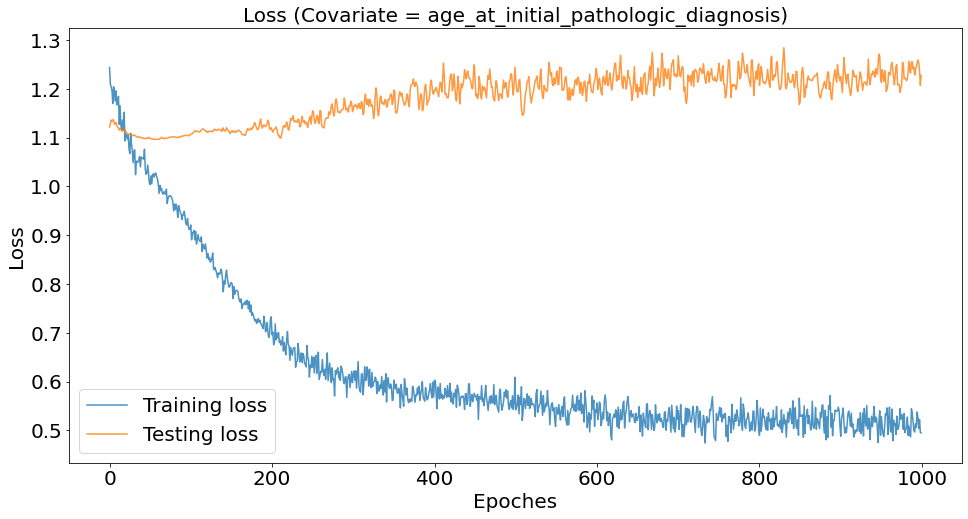

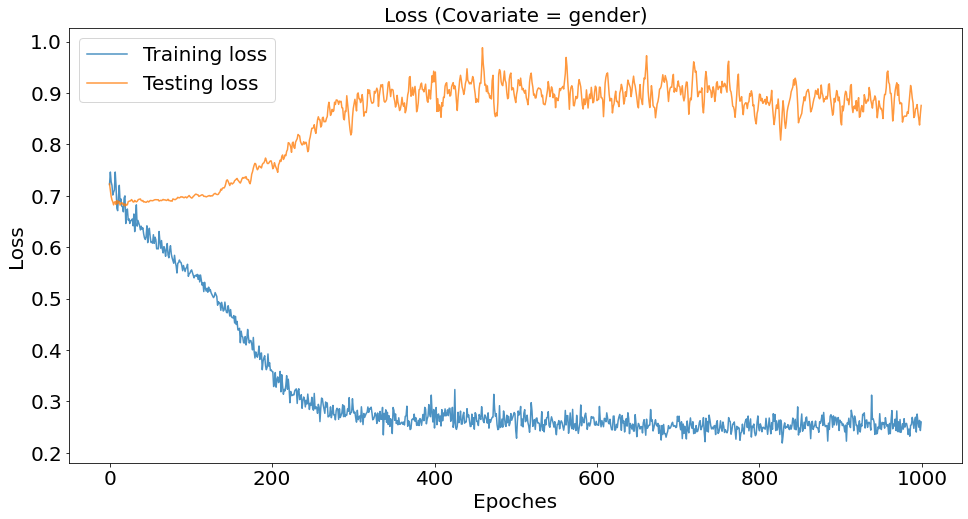

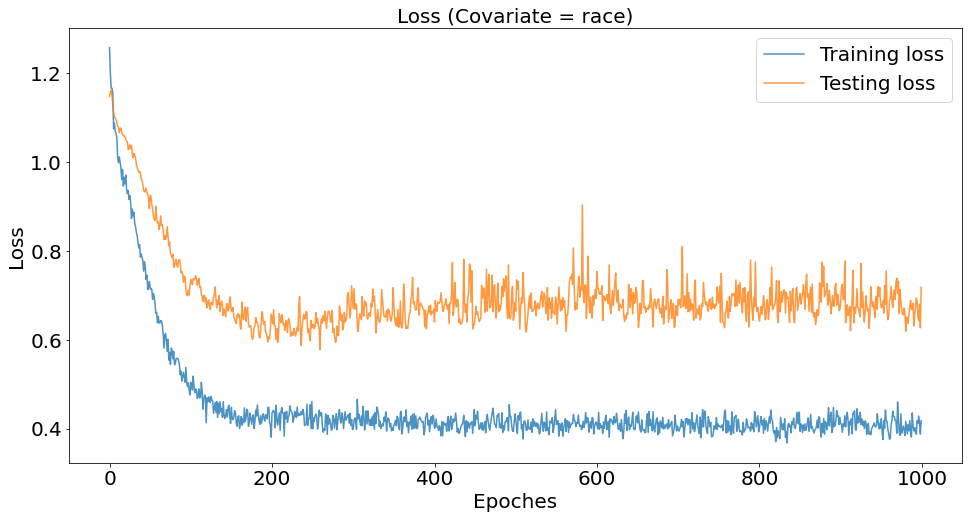

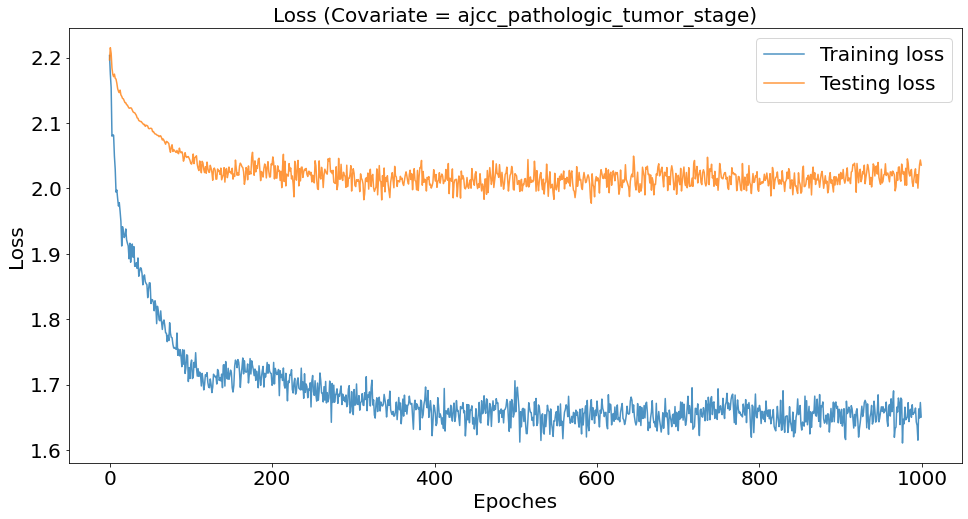

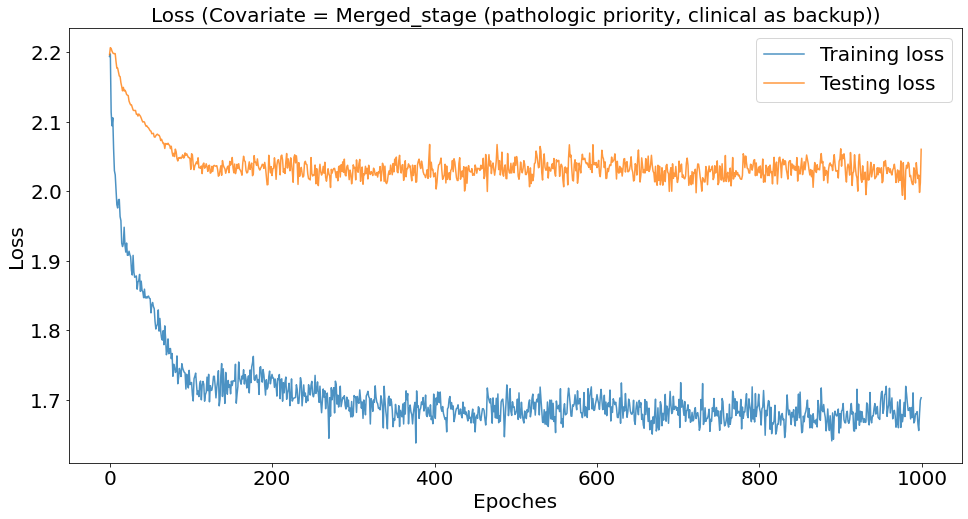

...

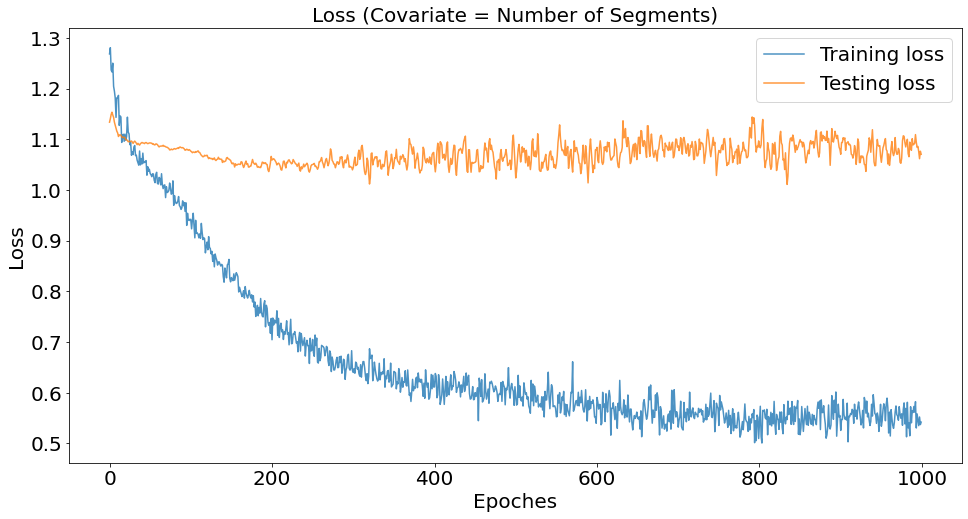

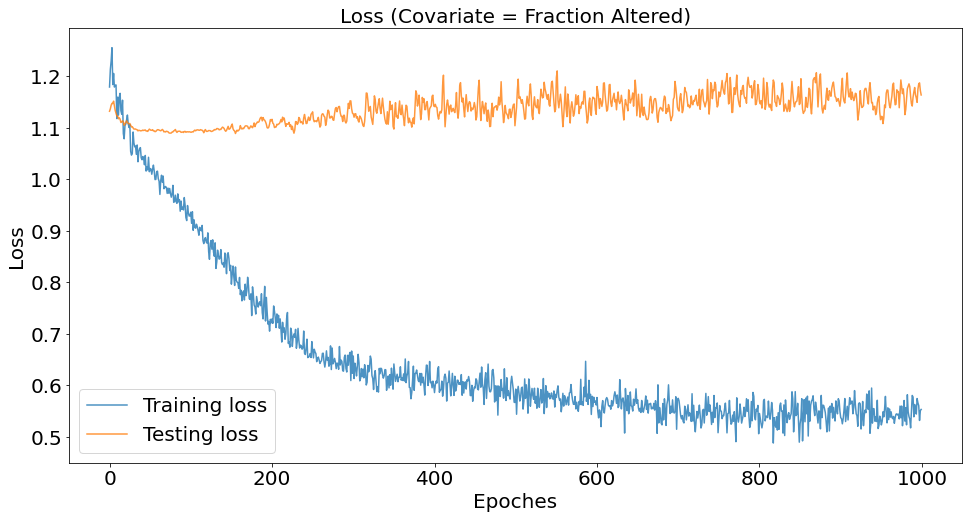

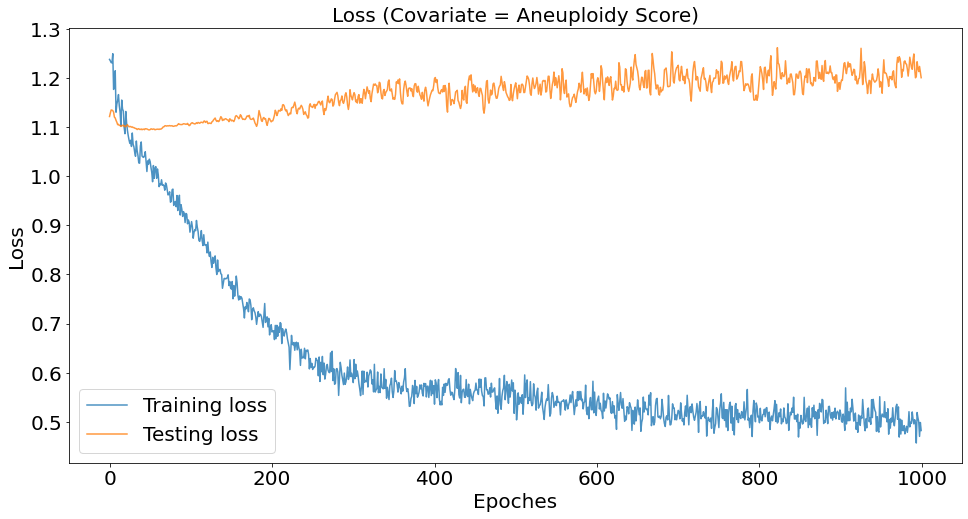

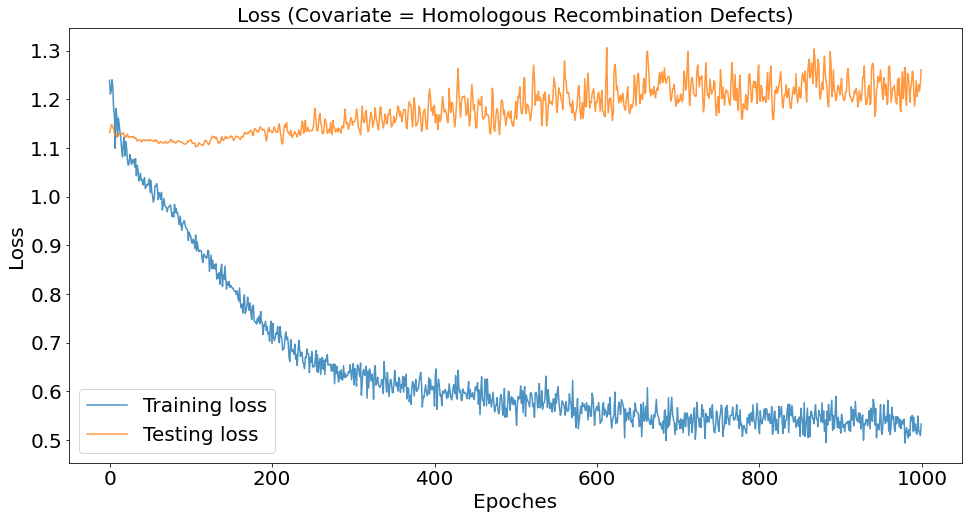

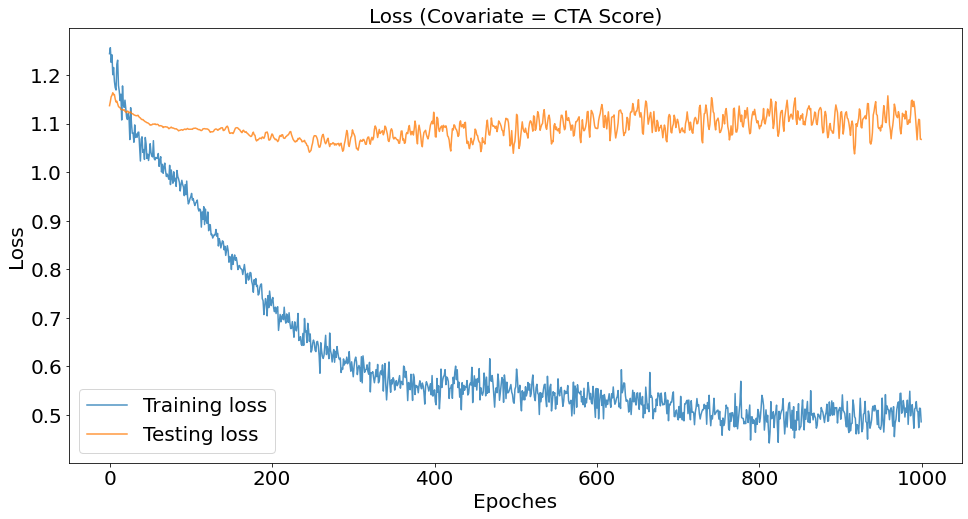

CPU times: user 31min 32s, sys: 2min 18s, total: 33min 50s
Wall time: 31min 42s


In [27]:
%%time
COAD_prediction_result_dict = train_mlp_all_cols('COAD', device=device, dropout_rate=0.4, weight_decay=0.1)

In [28]:
COAD_prediction_result_dict['auc']

{'age_at_initial_pathologic_diagnosis': (0.4566847147022074,
  0.47483157485868244),
 'gender': (0.5127030403998334, 0.48316498316498313),
 'race': (0.8811679492983251, 0.7802632419653697),
 'ajcc_pathologic_tumor_stage': (0.635626102292769, 0.5729574995501641),
 'Merged_stage (pathologic priority, clinical as backup)': (0.6149559082892416,
  0.5485907882069196),
 'histological_type': (0.8171595168679716, 0.4727891156462585),
 'initial_pathologic_dx_year': (0.6251561849229487, 0.6314925970388156),
 'birth_days_to': (0.44960433152852974, 0.4534438775510204),
 'vital_status': (0.6143273635985005, 0.3716216216216216),
 'tumor_status': (0.5635330578512396, 0.48177083333333337),
 'last_contact_days_to': (0.5236686390532543, 0.5404339250493096),
 'OS (dead=1)': (0.6143273635985005, 0.3716216216216216),
 'OS.time (days)': (0.3842149104539775, 0.38866341991341996),
 'DSS': (0.8440453686200378, 0.6375),
 'PFI': (0.5526863806747189, 0.40384615384615385),
 'PFI.time (days)': (0.5722615576842982, 

In [29]:
len(list(COAD_prediction_result_dict['auc'].keys()))

36

In [30]:
np.sort([x[0] for x in COAD_prediction_result_dict['auc'].values()])[::-1]

array([0.88116795, 0.84404537, 0.81715952, 0.77226156, 0.76721644,
       0.75757576, 0.74275362, 0.67388588, 0.64216299, 0.6356261 ,
       0.62515618, 0.6182    , 0.6156    , 0.61495591, 0.61432736,
       0.61432736, 0.60633681, 0.57226156, 0.56353306, 0.56349206,
       0.560808  , 0.55268638, 0.5444    , 0.52366864, 0.523     ,
       0.51270304, 0.50832986, 0.50478967, 0.49729279, 0.49135802,
       0.47479912, 0.45668471, 0.44960433, 0.44064973, 0.42857143,
       0.38421491])

In [31]:
np.sort([x[1] for x in COAD_prediction_result_dict['auc'].values()])[::-1]

array([0.78026324, 0.6375    , 0.6314926 , 0.61702317, 0.61495042,
       0.61336898, 0.60481771, 0.5729575 , 0.5725688 , 0.55523346,
       0.54935829, 0.54859079, 0.54043393, 0.52661319, 0.52225729,
       0.51053262, 0.50803958, 0.5       , 0.49595142, 0.49549849,
       0.48316498, 0.48177083, 0.47973268, 0.47784681, 0.47765766,
       0.47483157, 0.47278912, 0.45344388, 0.44153912, 0.43077458,
       0.42553545, 0.40384615, 0.38866342, 0.37439261, 0.37162162,
       0.37162162])

### STAD

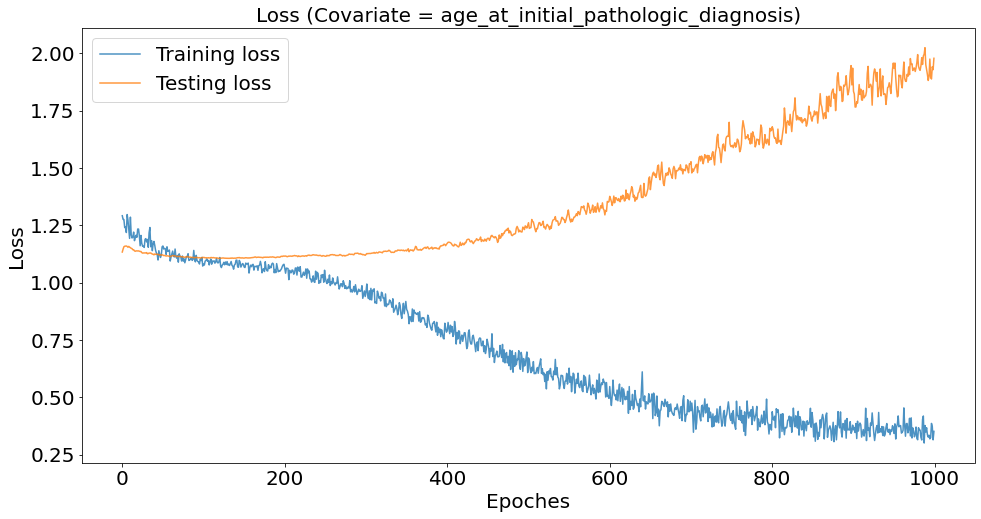

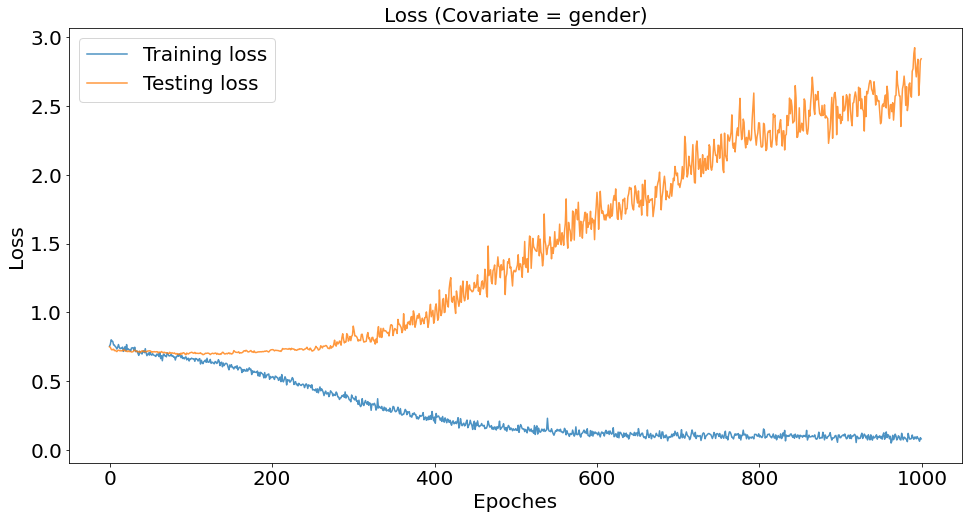

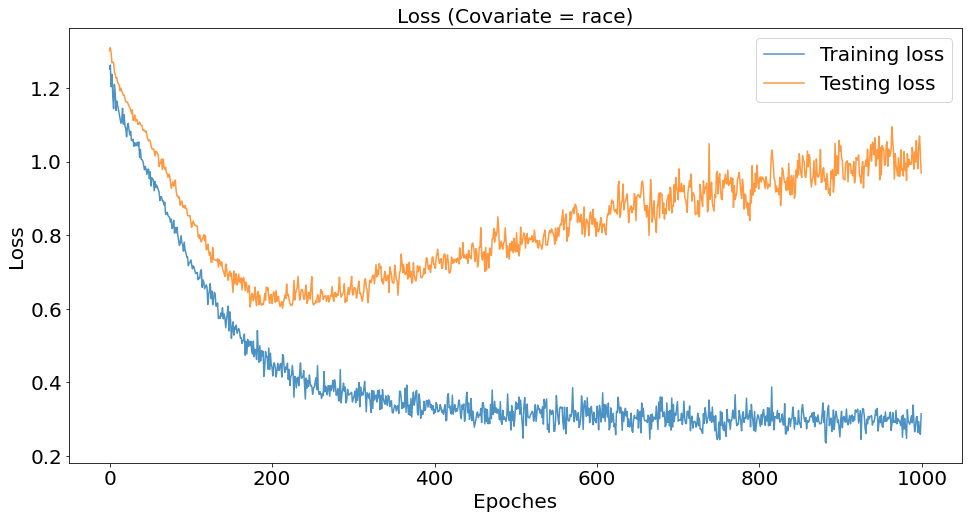

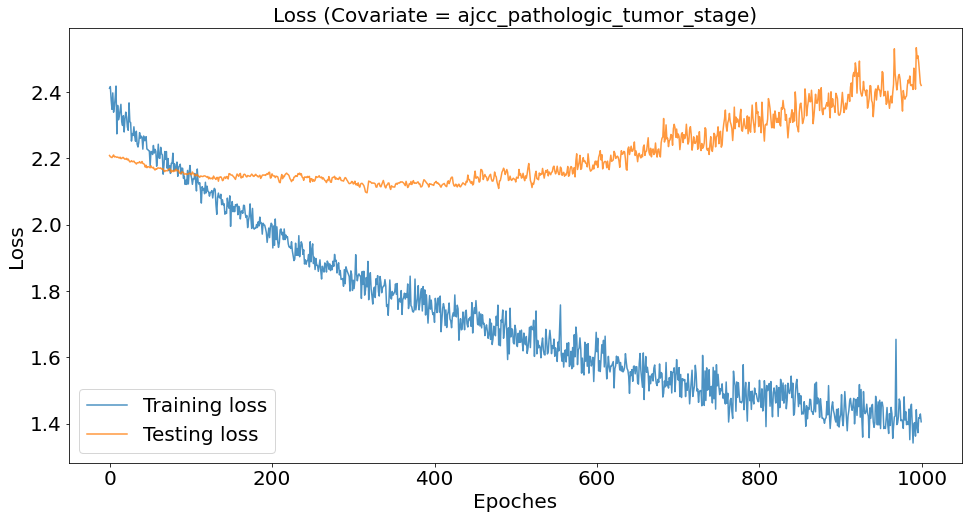

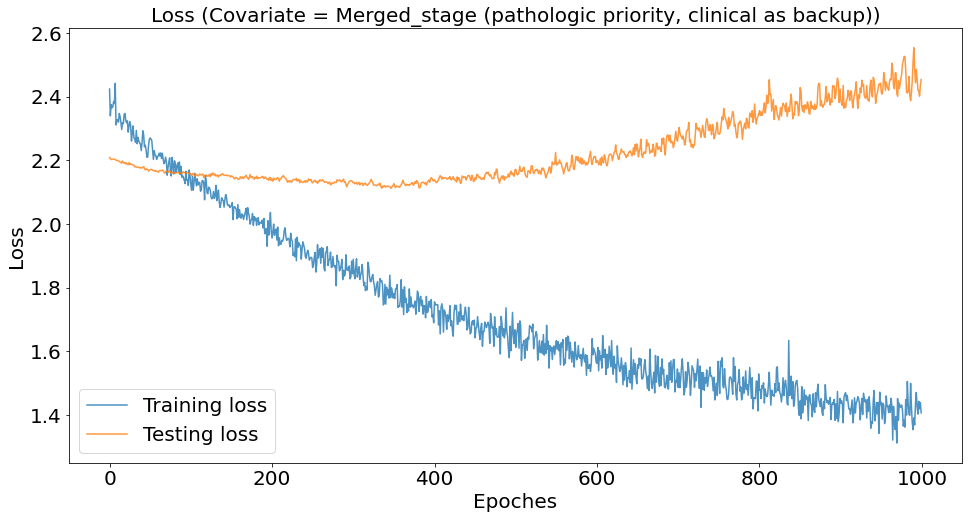

...

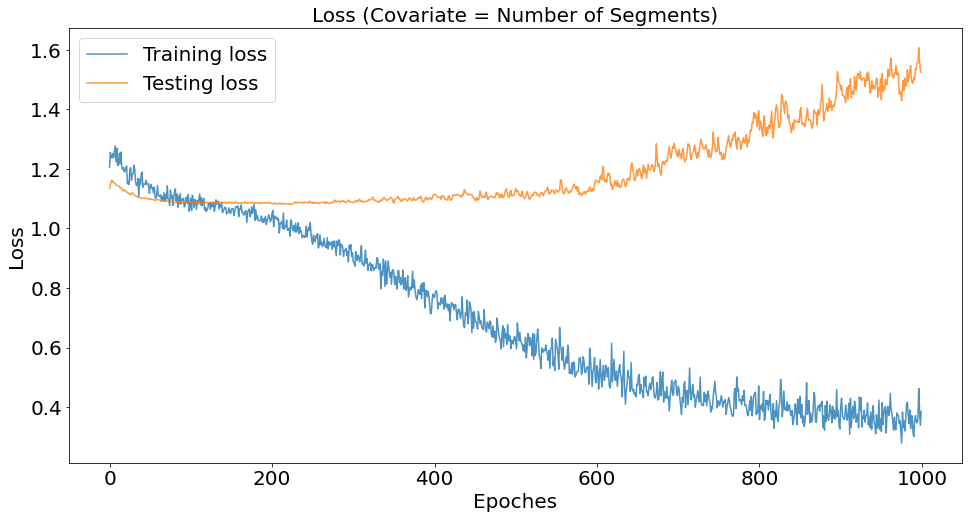

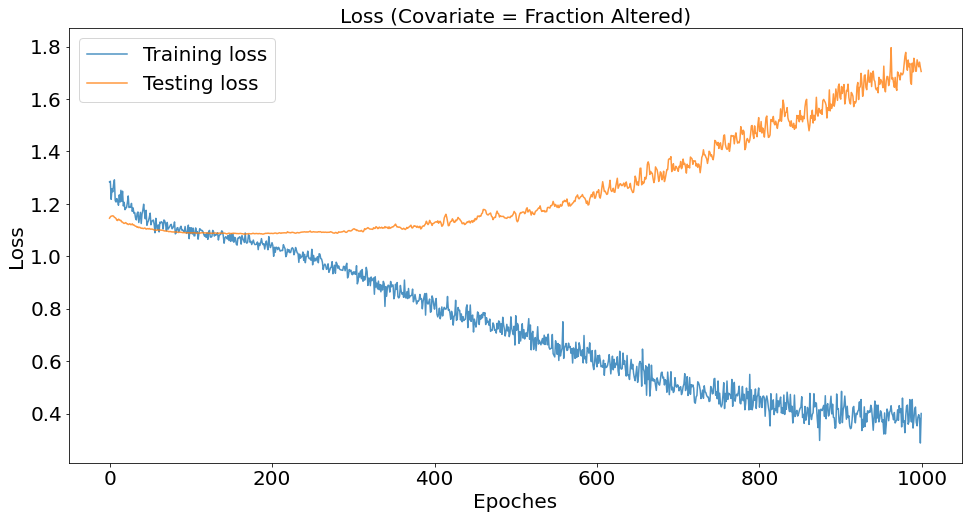

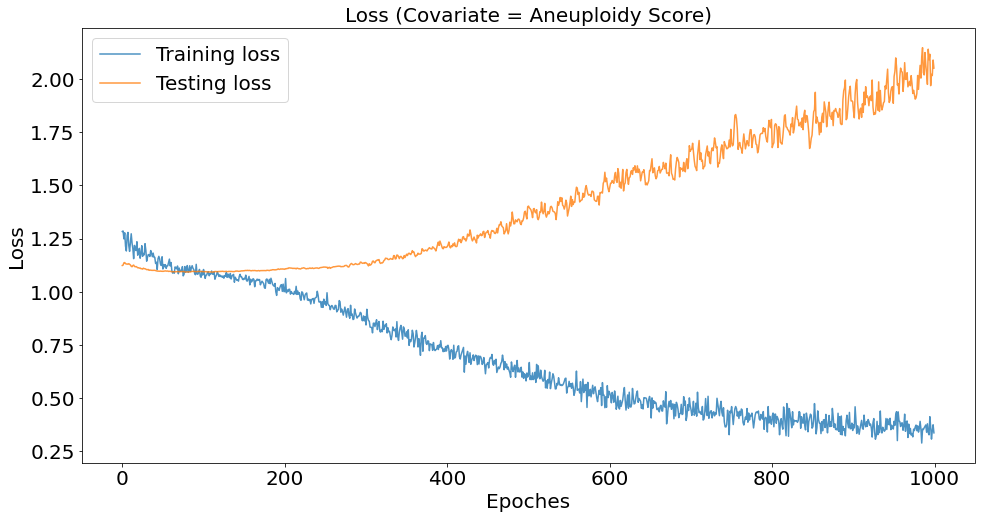

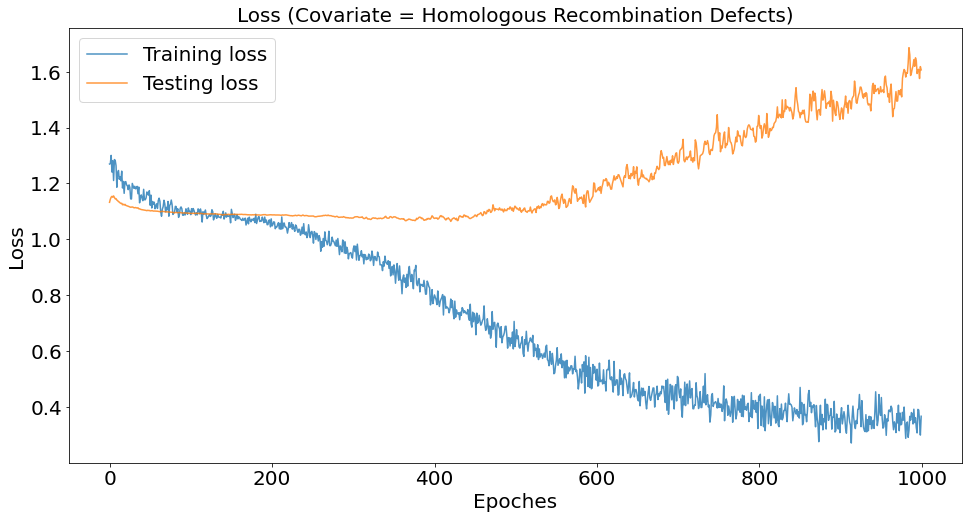

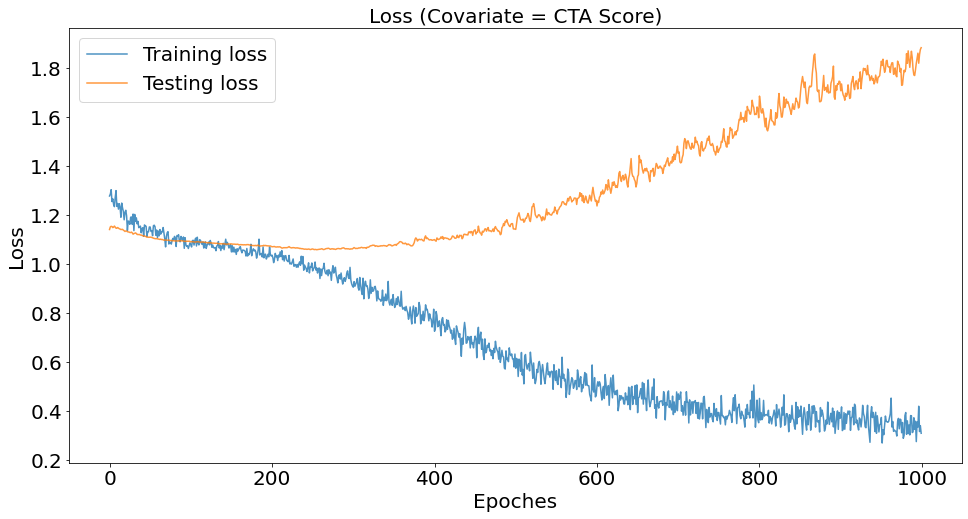

CPU times: user 46min, sys: 2min 32s, total: 48min 32s
Wall time: 46min 23s


In [32]:
%%time
STAD_prediction_result_dict = train_mlp_all_cols('STAD', device=device, dropout_rate=0.6, weight_decay=0.)

In [33]:
STAD_prediction_result_dict['auc']

{'age_at_initial_pathologic_diagnosis': (0.45420706371191133,
  0.4550101214574899),
 'gender': (0.6556440443213296, 0.5292307692307692),
 'race': (0.884161283136556, 0.7573542543691796),
 'ajcc_pathologic_tumor_stage': (0.5794981154532831, 0.5137934390574118),
 'Merged_stage (pathologic priority, clinical as backup)': (0.5721087085895656,
  0.5182508510635421),
 'histological_type': (0.7092855493998153, 0.5982807480048568),
 'histological_grade': (0.8308518005540165, 0.5643176005776053),
 'initial_pathologic_dx_year': (0.7098337950138504, 0.721163967611336),
 'birth_days_to': (0.4706666666666667, 0.4717333333333334),
 'vital_status': (0.5531509695290859, 0.4757887013939838),
 'tumor_status': (0.6211072664359861, 0.5420289855072464),
 'last_contact_days_to': (0.5923494794024445, 0.6015785861358957),
 'treatment_outcome_first_course': (0.852294921875, 0.7058247511350851),
 'OS (dead=1)': (0.5103878116343491, 0.45451210564930306),
 'OS.time (days)': (0.4848888888888888, 0.486133333333333

In [34]:
len(list(STAD_prediction_result_dict['auc'].keys()))

38

In [35]:
np.sort([x[0] for x in STAD_prediction_result_dict['auc'].values()])[::-1]

array([0.99584488, 0.92079294, 0.88416128, 0.85229492, 0.8308518 ,
       0.78848981, 0.76350309, 0.7591759 , 0.72134695, 0.7173361 ,
       0.7098338 , 0.70928555, 0.65564404, 0.65330679, 0.64871884,
       0.63504155, 0.62110727, 0.60985111, 0.59795556, 0.59733333,
       0.59234948, 0.57949812, 0.57210871, 0.56977147, 0.56847299,
       0.56466263, 0.55315097, 0.53851607, 0.53376039, 0.53350069,
       0.51118827, 0.51038781, 0.492     , 0.48488889, 0.48467798,
       0.47066667, 0.45420706, 0.45244444])

In [36]:
np.sort([x[1] for x in STAD_prediction_result_dict['auc'].values()])[::-1]

array([0.88392857, 0.75735425, 0.72116397, 0.70582475, 0.665     ,
       0.64705882, 0.64623397, 0.61185759, 0.6025974 , 0.60157859,
       0.59828075, 0.59824474, 0.59630359, 0.57616099, 0.57339637,
       0.57236326, 0.5643176 , 0.56001874, 0.5537682 , 0.54202899,
       0.5400827 , 0.53915581, 0.53252322, 0.53122955, 0.52923077,
       0.52553148, 0.51825085, 0.51379344, 0.51108512, 0.49768519,
       0.49172343, 0.48613333, 0.4757887 , 0.47173333, 0.45713923,
       0.45501012, 0.45451211, 0.44978979])

### LUAD

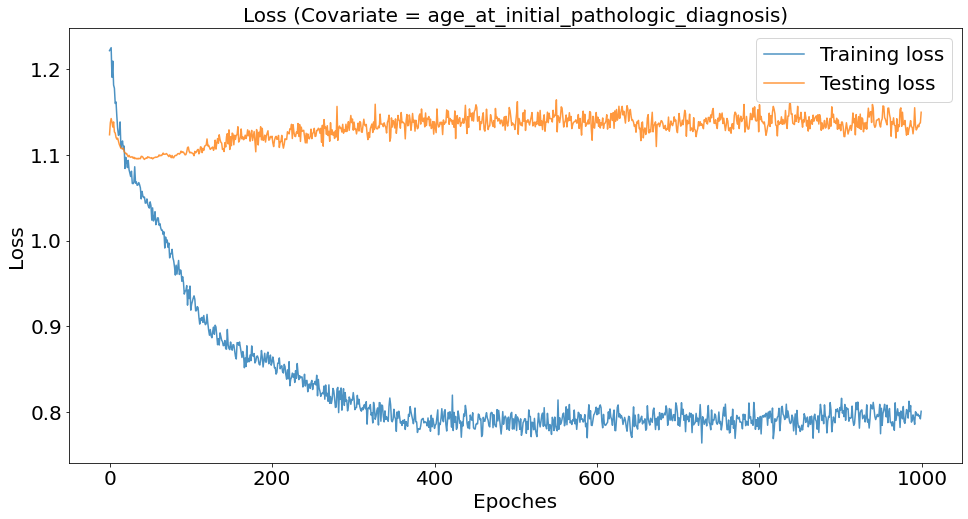

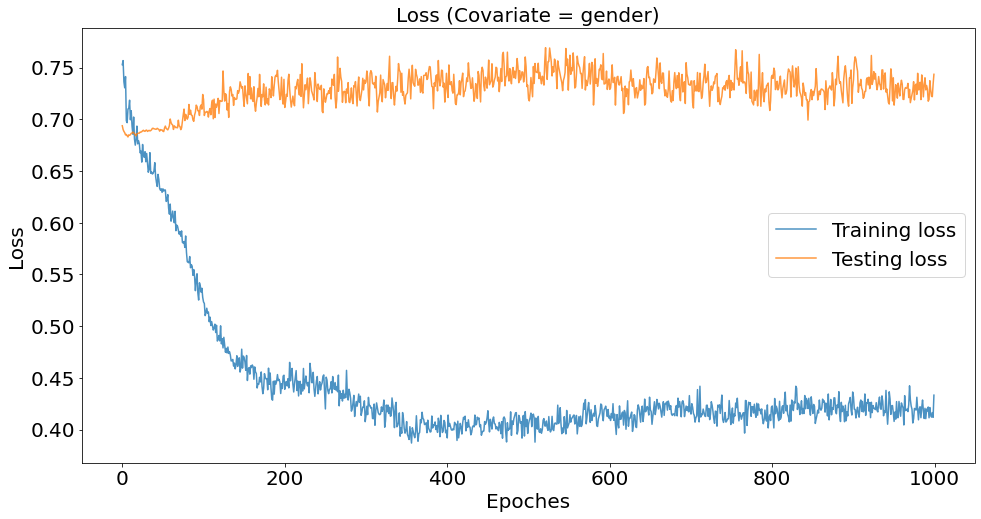

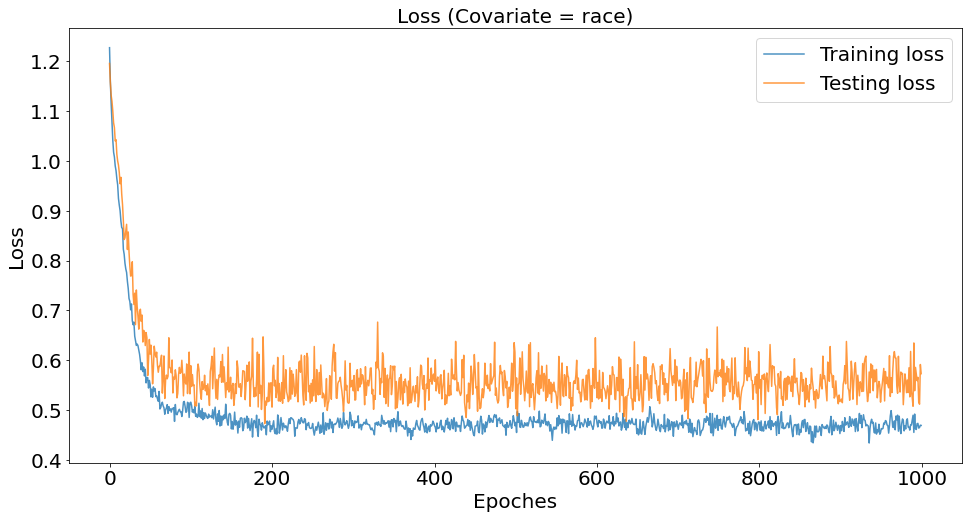

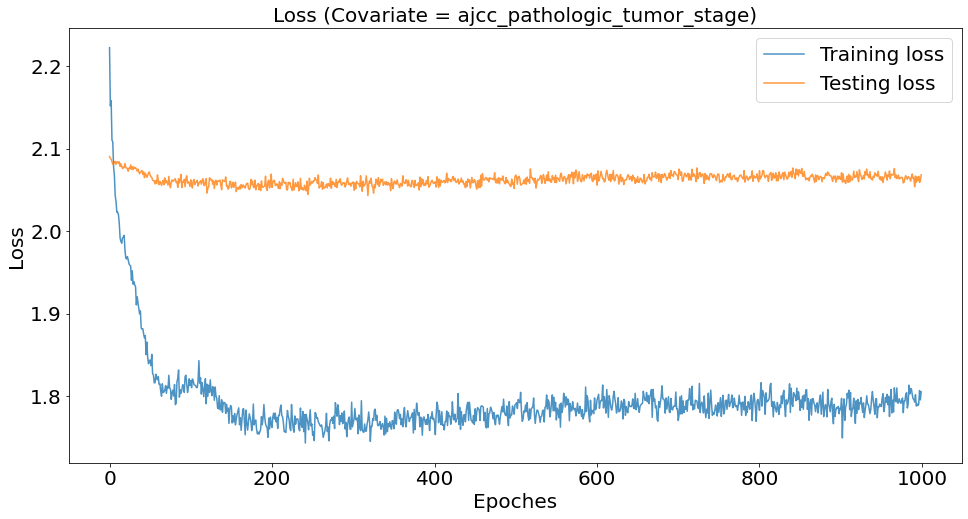

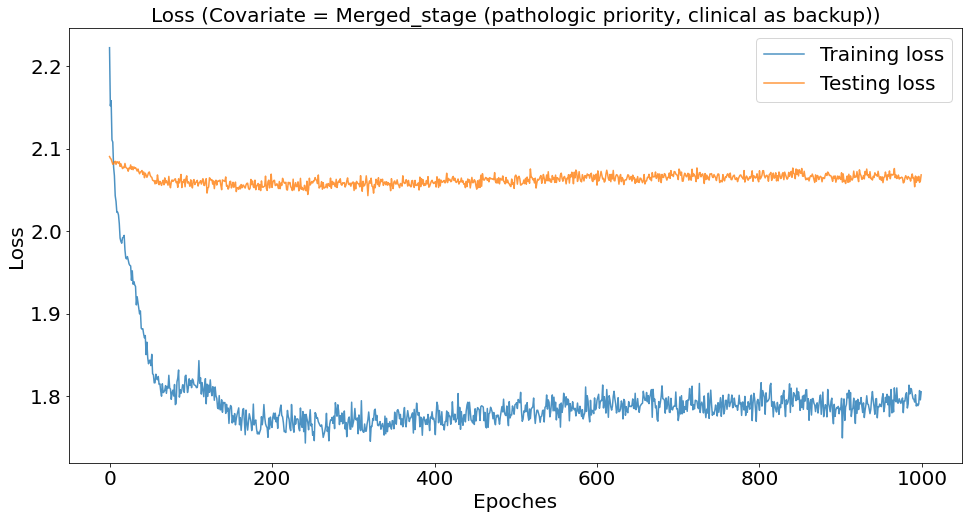

...

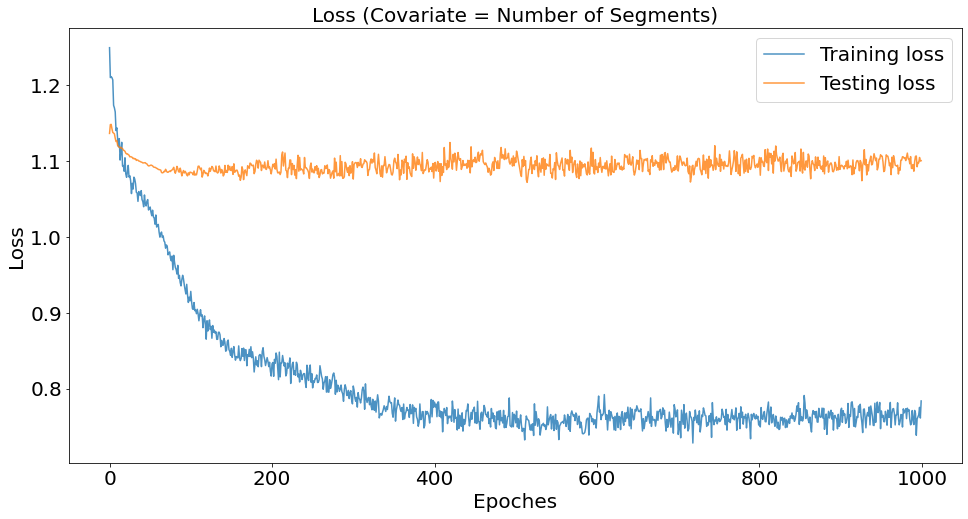

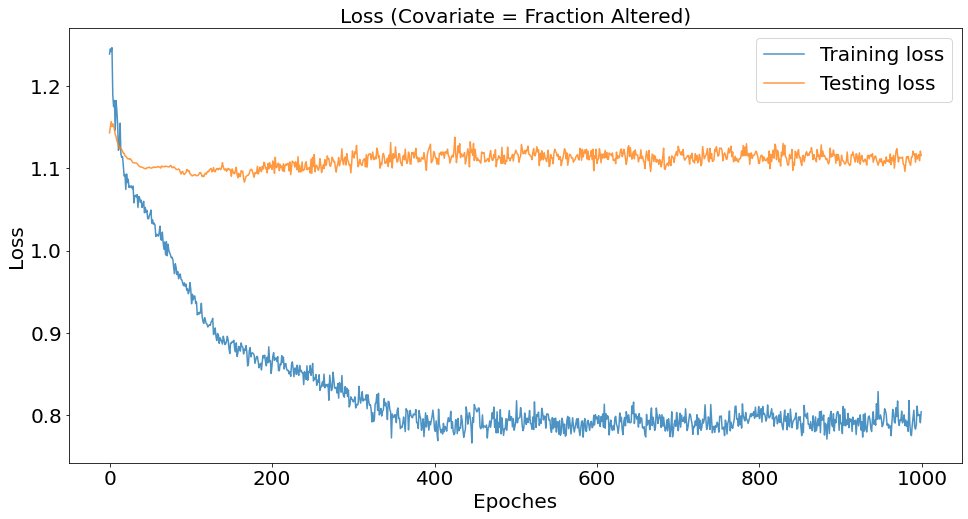

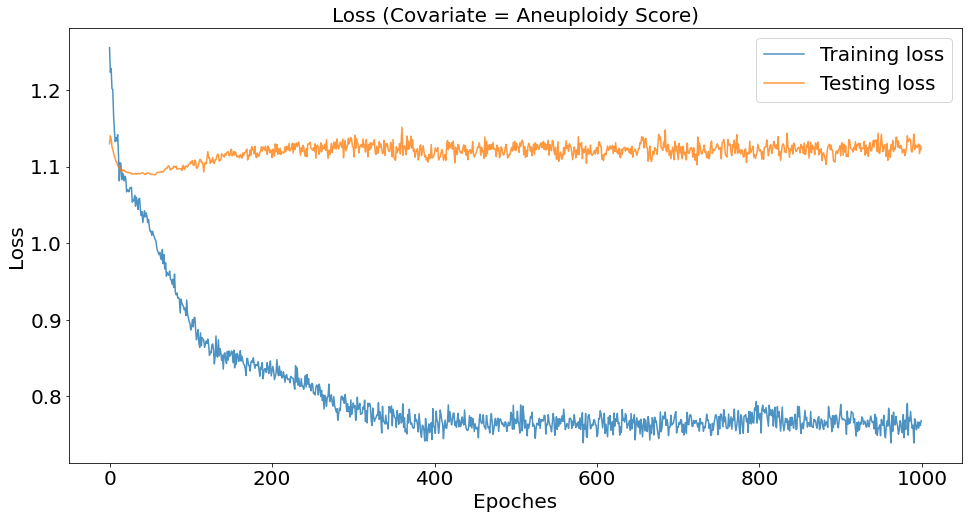

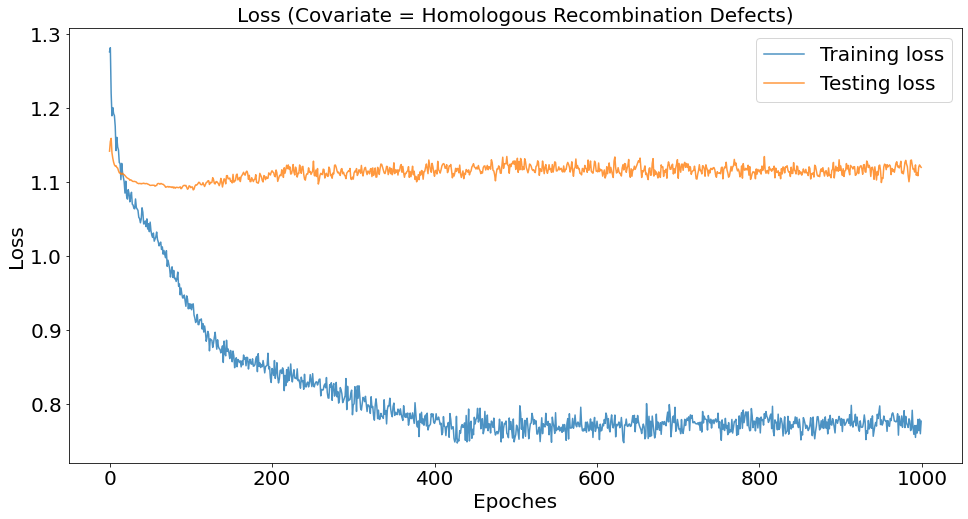

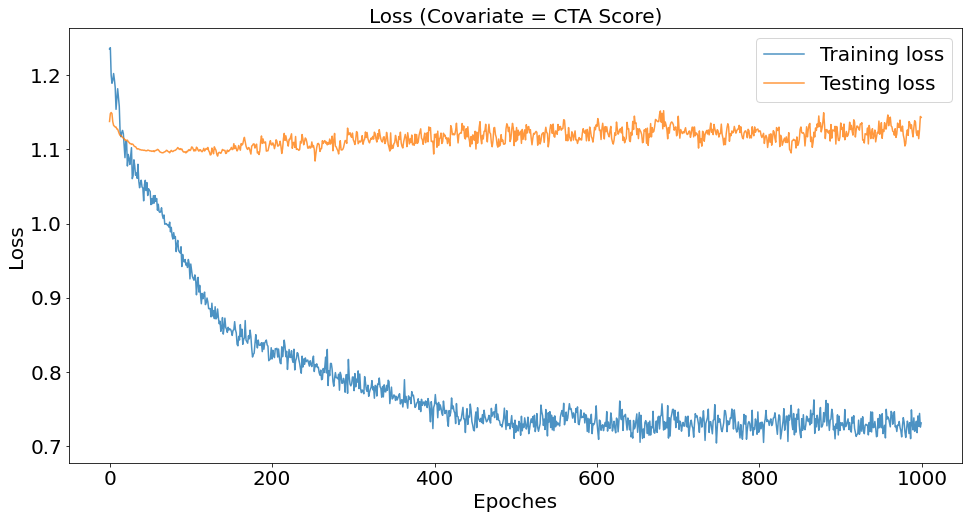

CPU times: user 52min 58s, sys: 2min 15s, total: 55min 14s
Wall time: 53min 29s


In [37]:
%%time
LUAD_prediction_result_dict = train_mlp_all_cols('LUAD', device=device, dropout_rate=0.4, weight_decay=0.1)

In [38]:
LUAD_prediction_result_dict['auc']

{'age_at_initial_pathologic_diagnosis': (0.4391540014879371,
  0.4368018740585692),
 'gender': (0.5073032055680815, 0.5214736012608353),
 'race': (0.9432463842975207, 0.7720733420184831),
 'ajcc_pathologic_tumor_stage': (0.5955952016558077, 0.4870912739847155),
 'Merged_stage (pathologic priority, clinical as backup)': (0.5955952016558077,
  0.4870912739847155),
 'initial_pathologic_dx_year': (0.6584532190592797, 0.638859862997794),
 'birth_days_to': (0.582382271468144, 0.5794094611528822),
 'vital_status': (0.6297421821390061, 0.6499999999999999),
 'tumor_status': (0.5597530864197532, 0.5308346624136098),
 'last_contact_days_to': (0.49562130177514796, 0.4992356480728574),
 'treatment_outcome_first_course': (0.775777810035322, 0.5098615993406966),
 'OS (dead=1)': (0.6297421821390061, 0.6499999999999999),
 'OS.time (days)': (0.5089276604428119, 0.5114784205693297),
 'DSS': (0.7849705749207786, 0.6493055555555555),
 'PFI': (0.47034604450544065, 0.49651639344262294),
 'PFI.time (days)': (

In [39]:
len(list(LUAD_prediction_result_dict['auc'].keys()))

34

In [40]:
np.sort([x[0] for x in LUAD_prediction_result_dict['auc'].values()])[::-1]

array([0.97887812, 0.94324638, 0.78591682, 0.78497057, 0.77577781,
       0.71403333, 0.70006667, 0.65845322, 0.62974218, 0.62974218,
       0.6137037 , 0.59834286, 0.5955952 , 0.5955952 , 0.58238227,
       0.57762391, 0.55975309, 0.55191358, 0.5433781 , 0.54125977,
       0.53451687, 0.51980198, 0.51171454, 0.50892766, 0.50730321,
       0.49846954, 0.4956213 , 0.49148046, 0.47770636, 0.47034604,
       0.46739411, 0.46402313, 0.44510204, 0.439154  ])

In [41]:
np.sort([x[1] for x in LUAD_prediction_result_dict['auc'].values()])[::-1]

array([0.77207334, 0.65      , 0.65      , 0.64930556, 0.63885986,
       0.62111111, 0.58077934, 0.57940946, 0.55444444, 0.54709813,
       0.54295577, 0.5374434 , 0.53243413, 0.53083466, 0.53035404,
       0.52870404, 0.5214736 , 0.51596198, 0.51147842, 0.5098616 ,
       0.50822982, 0.49923565, 0.49676844, 0.49651639, 0.49279189,
       0.49158249, 0.48709127, 0.48709127, 0.46938593, 0.46752188,
       0.44304876, 0.4375    , 0.43680187, 0.19333333])

### LUSC

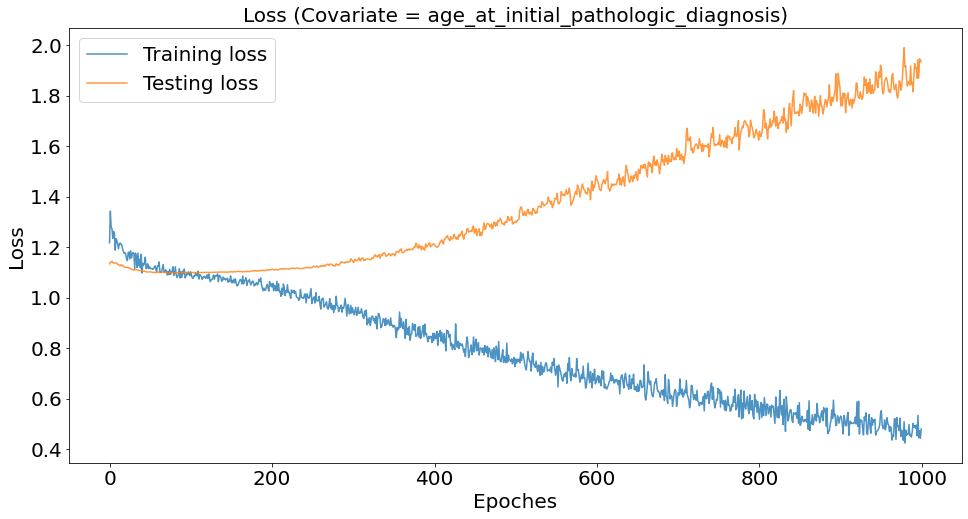

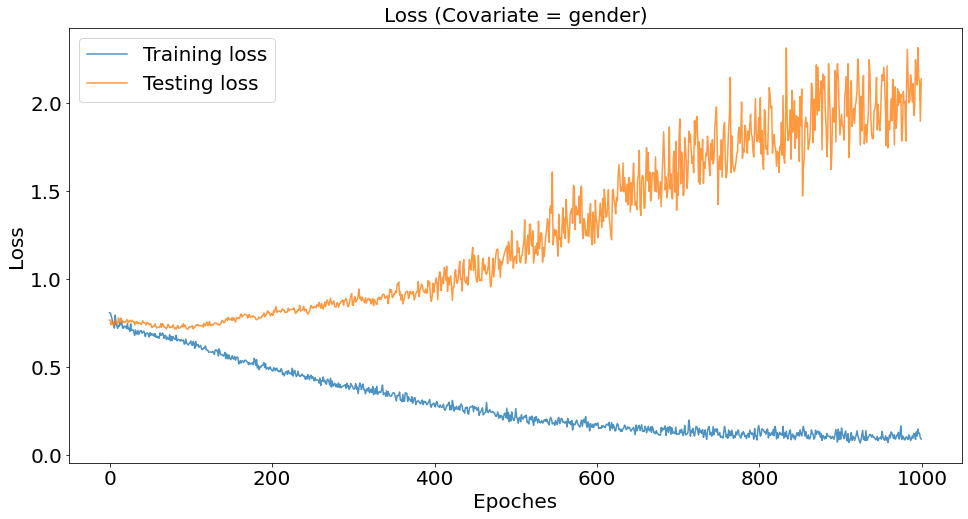

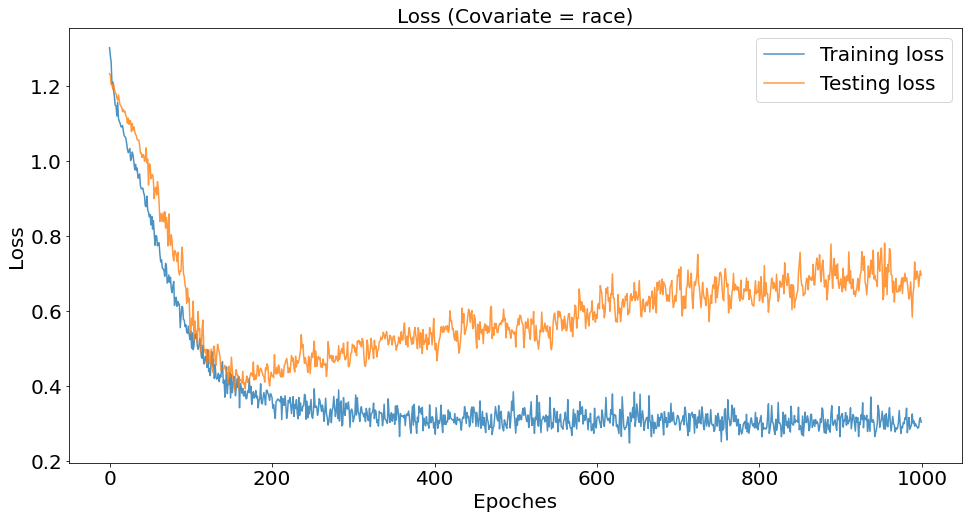

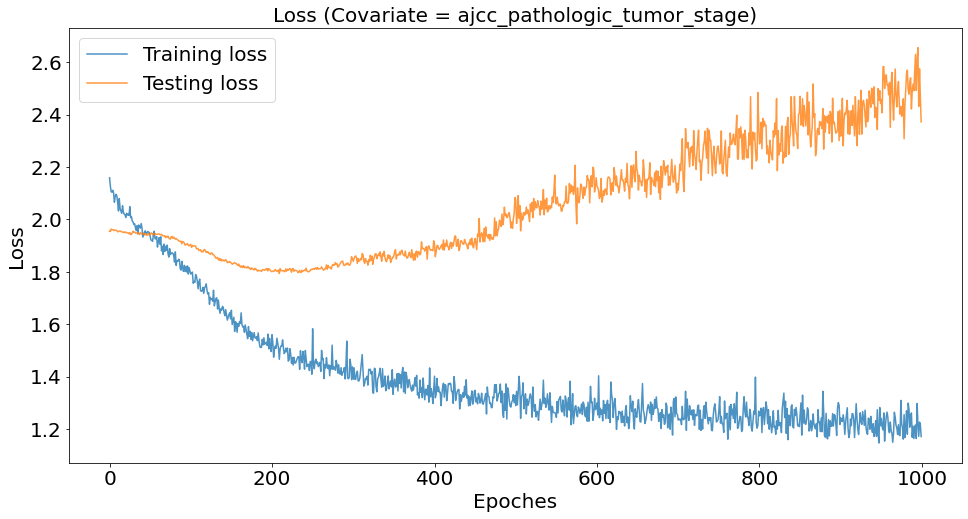

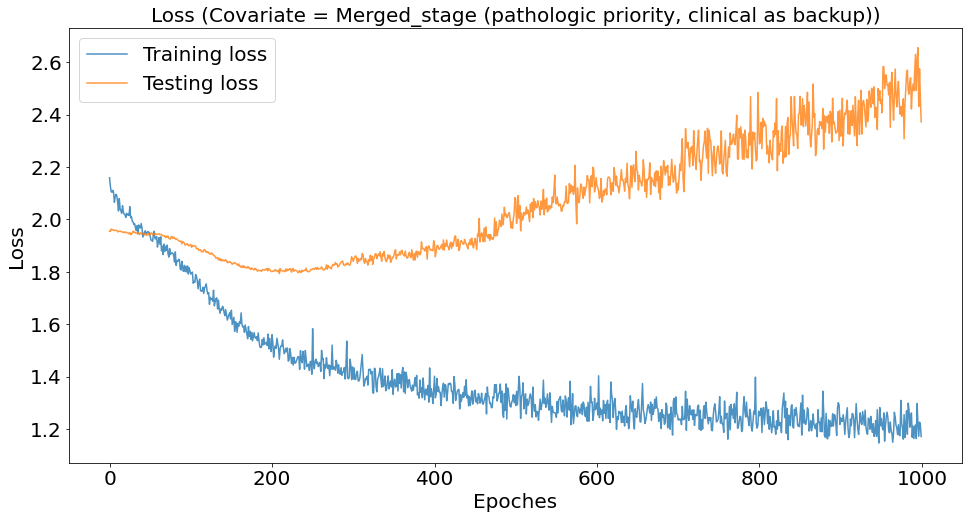

...

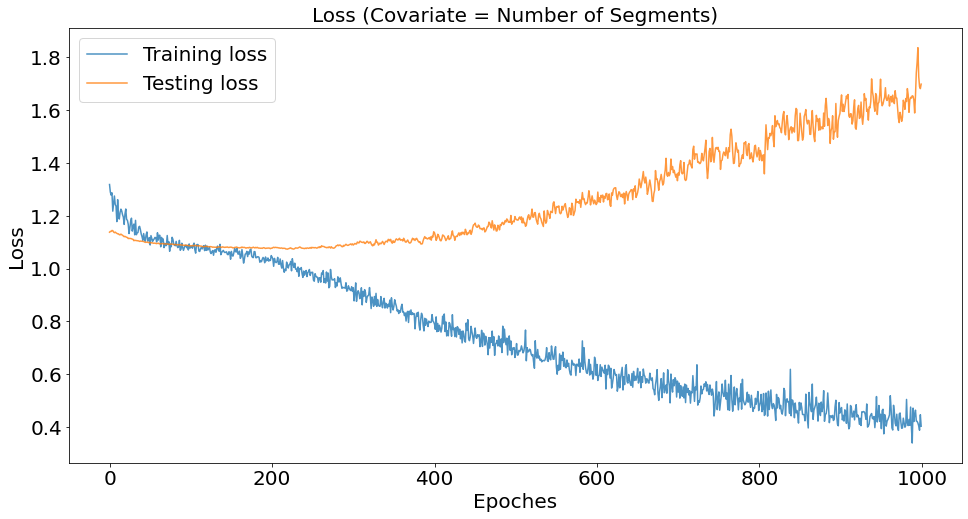

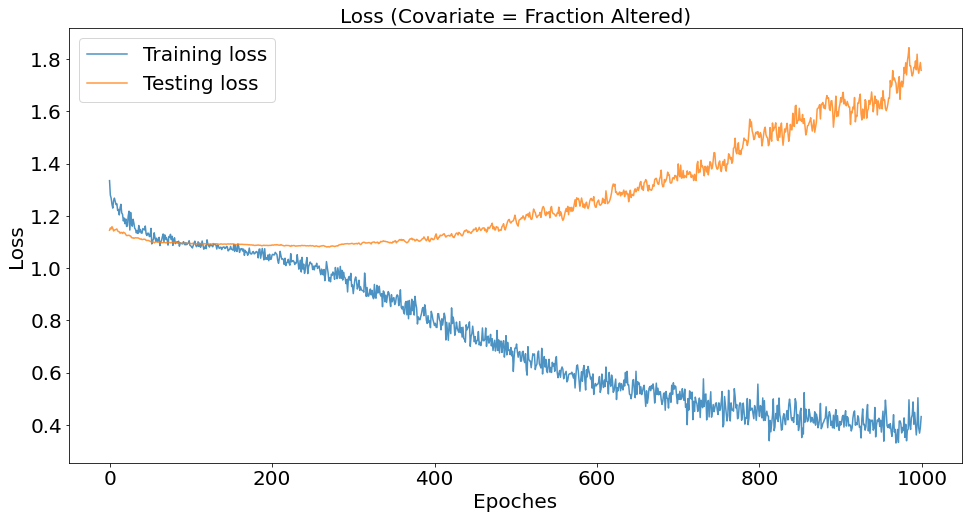

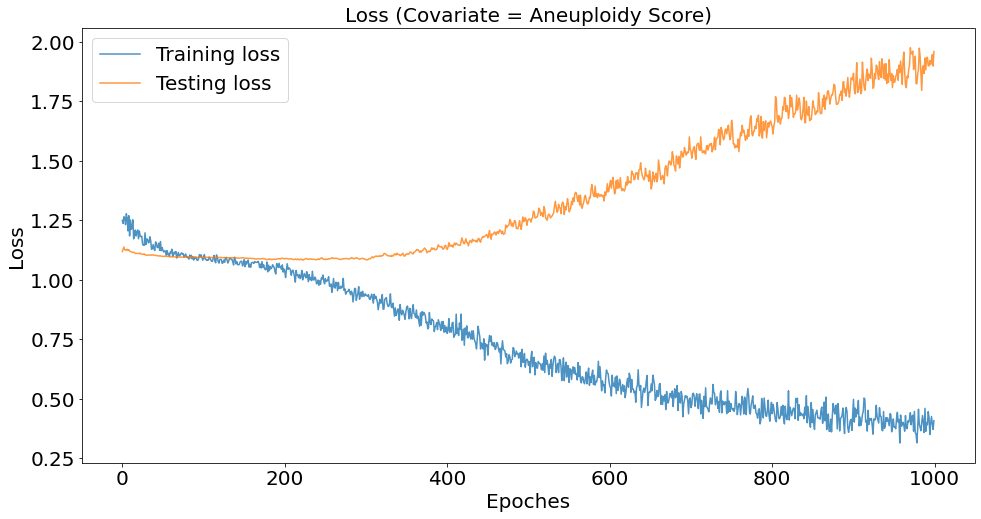

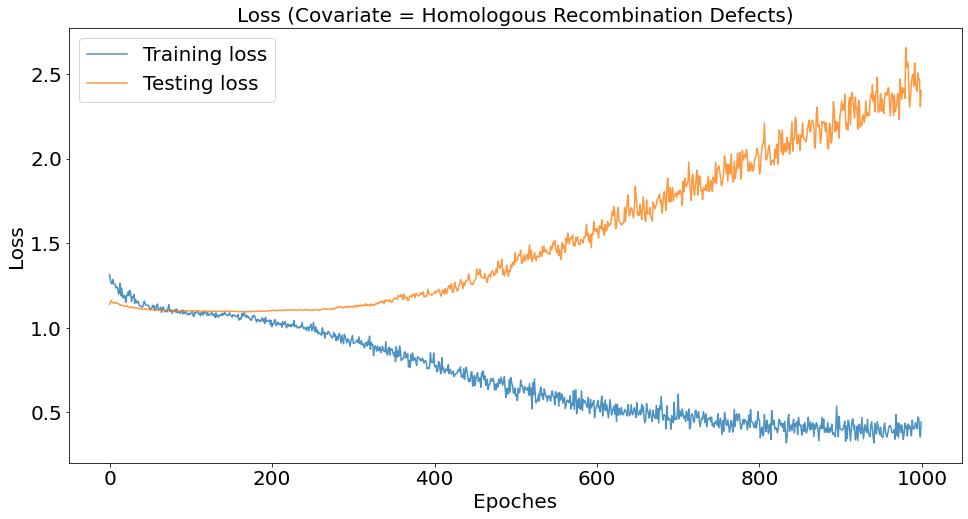

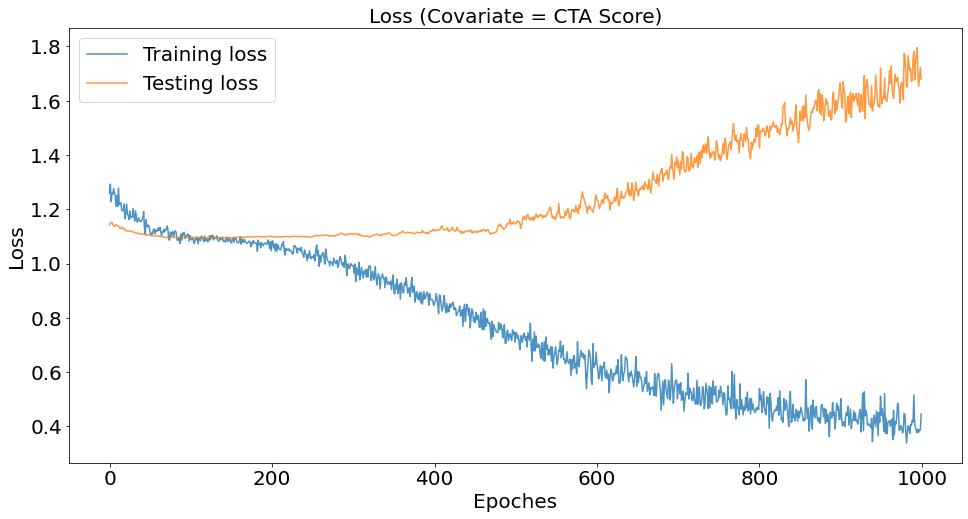

CPU times: user 45min 28s, sys: 2min 5s, total: 47min 33s
Wall time: 45min 54s


In [42]:
%%time
LUSC_prediction_result_dict = train_mlp_all_cols('LUSC', device=device, dropout_rate=0.6, weight_decay=0.)

In [43]:
LUSC_prediction_result_dict['auc']

{'age_at_initial_pathologic_diagnosis': (0.4813428329911846,
  0.46654305190726597),
 'gender': (0.6953405017921146, 0.5035294117647059),
 'race': (0.9416400825670858, 0.6167293851748687),
 'ajcc_pathologic_tumor_stage': (0.6331763474620618, 0.5685505981436028),
 'Merged_stage (pathologic priority, clinical as backup)': (0.6331763474620618,
  0.5685505981436028),
 'initial_pathologic_dx_year': (0.7269135802469134, 0.7189042173197205),
 'birth_days_to': (0.44819466248037676, 0.4525070557857443),
 'vital_status': (0.5538212510116777, 0.5452830188679245),
 'tumor_status': (0.6751562499999999, 0.6358333333333334),
 'last_contact_days_to': (0.6057511421660844, 0.5962415033986406),
 'treatment_outcome_first_course': (0.9379594564490978, 0.697590641396841),
 'OS (dead=1)': (0.5538212510116777, 0.5452830188679245),
 'OS.time (days)': (0.5556474480151229, 0.555026096153404),
 'DSS': (0.7063492063492063, 0.4549632352941177),
 'DFI': (0.7614650661742074, 0.5574074074074074),
 'DFI.time (days)': (

In [44]:
len(list(LUSC_prediction_result_dict['auc'].keys()))

35

In [45]:
np.sort([x[0] for x in LUSC_prediction_result_dict['auc'].values()])[::-1]

array([0.97277778, 0.94164008, 0.93795946, 0.86942296, 0.80503526,
       0.77752836, 0.76146507, 0.72691358, 0.70634921, 0.6953405 ,
       0.67515625, 0.67296797, 0.65098852, 0.63920684, 0.63317635,
       0.63317635, 0.61082206, 0.60575114, 0.59879755, 0.59549411,
       0.59544456, 0.5669896 , 0.55564745, 0.55422592, 0.55382125,
       0.55382125, 0.53898866, 0.53081281, 0.52828072, 0.52693953,
       0.52358654, 0.51294947, 0.48134283, 0.45057232, 0.44819466])

In [46]:
np.sort([x[1] for x in LUSC_prediction_result_dict['auc'].values()])[::-1]

array([0.71890422, 0.69759064, 0.67836557, 0.6419935 , 0.64134582,
       0.63583333, 0.61672939, 0.61206897, 0.61111111, 0.60735345,
       0.5962415 , 0.59586205, 0.5685506 , 0.5685506 , 0.56716418,
       0.55740741, 0.55515088, 0.5550261 , 0.54528302, 0.54528302,
       0.54009553, 0.53637942, 0.53607353, 0.52930975, 0.52482786,
       0.52282847, 0.51269583, 0.50352941, 0.49848436, 0.47967047,
       0.46654305, 0.45736797, 0.45496324, 0.45250706, 0.44348865])